In [1]:
## Notebook env: cell2loc_env (cell2loc_env kernel)
## this notebook performs cell2location to *spatially* deconvolute cells using a reference annotated scRNAseq dataset

In [1]:
import sys
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import os

data_type = 'float32'

import cell2location

import matplotlib as mpl
from matplotlib import rcParams
import matplotlib.pyplot as plt
import seaborn as sns

# silence scanpy that prints a lot of warnings
import warnings
warnings.filterwarnings('ignore')

Global seed set to 0


## Load in reference data, normalized and cell type + sample corrected

In [2]:
results_folder = '/home/ssobti/projects/farnaz_spatial/output_data'

# create paths and names to results folders for reference regression and cell2location models
ref_run_name = f'{results_folder}/mouse/cell2location/multi_ref_annot/reference_signatures'
run_name = f'{results_folder}/mouse_late_2023/cell2location/multi_ref_annot/cell2location_map/N2_alpha20_cleaned_slides_v2'

In [3]:
adata_file = f"{ref_run_name}/sc.h5ad"
adata_ref = sc.read_h5ad(adata_file)
mod = cell2location.models.RegressionModel.load(f"{ref_run_name}", adata_ref)

INFO     File                                                                                                      
         /home/ssobti/projects/farnaz_spatial/output_data/mouse/cell2location/multi_ref_annot/reference_signatures/
         model.pt already downloaded                                                                               


No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 1/69:   1%|▏         | 1/69 [00:03<03:25,  3.02s/it, v_num=1, elbo_train=1.64e+9]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/69:   1%|▏         | 1/69 [00:03<03:29,  3.08s/it, v_num=1, elbo_train=1.64e+9]


In [4]:
# export estimated expression in each cluster
if 'means_per_cluster_mu_fg' in adata_ref.varm.keys():
    inf_aver = adata_ref.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}' for i in adata_ref.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_ref.var[[f'means_per_cluster_mu_fg_{i}' for i in adata_ref.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_ref.uns['mod']['factor_names']
inf_aver.iloc[0:5, 0:5]

## remove white adipocytes category -- it's redundant with Adipocytes
inf_aver = inf_aver.drop('white adipocytes', axis = 1)

In [5]:
inf_aver

,Adipocyte_progenitors,Adipocytes,B_cells,Brown_adipocytes,Endothelial_cells,Eosinophils,Epithelial_cells,Lymphatic_endothelial_cells,Macrophages,Mast_cells,Mesothelium,NK_cells,Neutrophils,Pericytes,Schwan_cells,Skeletal_muscle,T_cells,Tregs,Vascular_smooth_muscle
Xkr4,0.856888,1.333403,0.000017,0.001237,0.012203,0.001720,0.447235,0.027294,0.000071,0.014462,2.877686,0.000116,0.000547,0.231026,0.032447,0.012408,0.000030,0.000917,0.909910
Sox17,0.000777,0.000151,0.000249,0.002336,1.495620,0.007271,0.000531,0.011183,0.000270,0.007895,0.000698,0.001067,0.001689,0.003726,0.002905,0.012651,0.000184,0.006084,0.003812
Mrpl15,0.126718,0.252087,0.043601,2.367598,0.171279,0.016527,0.290706,0.226614,0.145973,0.031073,0.169864,0.041783,0.001560,0.110467,0.065814,0.327648,0.056897,0.295870,0.306349
Lypla1,0.080591,0.257422,0.027917,1.354572,0.146360,0.025678,0.302260,0.217248,0.085147,0.065710,0.182940,0.031676,0.016715,0.099241,0.052962,0.234781,0.034007,0.129567,0.169079
Tcea1,0.185279,0.276333,0.027876,0.882814,0.317588,0.009997,0.285317,0.355022,0.194744,0.039495,0.207420,0.019747,0.002272,0.144656,0.183290,0.203325,0.034260,0.204895,0.364905
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ccr8,0.000044,0.000173,0.000103,0.004542,0.000237,0.001324,0.000398,0.001047,0.000055,0.013905,0.000485,0.000432,0.000620,0.000967,0.000920,0.011439,0.004128,0.013304,0.000133
Ccdc152,0.039889,2.767001,0.000177,0.022622,0.008079,0.001701,0.000231,0.046807,0.141066,0.013182,0.001394,0.000802,0.000587,0.012783,0.005381,0.015925,0.001040,0.003224,0.002230
Fbxo40,0.000094,0.000646,0.000328,0.001754,0.001043,0.000819,0.002556,0.001625,0.006626,0.007780,0.000163,0.000211,0.001157,0.001230,0.000455,2.641539,0.000218,0.006681,0.020354
Extl1,0.000188,0.000174,0.003647,0.004905,0.000550,0.001639,0.274074,0.001722,0.001000,0.033688,0.050081,0.000342,0.000656,0.000934,0.003674,0.088841,0.000124,0.004275,0.001576


In [6]:
adata_ref.uns['mod']['factor_names']

array(['Adipocyte_progenitors', 'Adipocytes', 'B_cells',
       'Brown_adipocytes', 'Endothelial_cells', 'Eosinophils',
       'Epithelial_cells', 'Lymphatic_endothelial_cells', 'Macrophages',
       'Mast_cells', 'Mesothelium', 'NK_cells', 'Neutrophils',
       'Pericytes', 'Schwan_cells', 'Skeletal_muscle', 'T_cells', 'Tregs',
       'Vascular_smooth_muscle', 'white adipocytes'], dtype=object)

In [7]:
adata_ref.varm['means_per_cluster_mu_fg']

,means_per_cluster_mu_fg_Adipocyte_progenitors,means_per_cluster_mu_fg_Adipocytes,means_per_cluster_mu_fg_B_cells,means_per_cluster_mu_fg_Brown_adipocytes,means_per_cluster_mu_fg_Endothelial_cells,means_per_cluster_mu_fg_Eosinophils,means_per_cluster_mu_fg_Epithelial_cells,means_per_cluster_mu_fg_Lymphatic_endothelial_cells,means_per_cluster_mu_fg_Macrophages,means_per_cluster_mu_fg_Mast_cells,means_per_cluster_mu_fg_Mesothelium,means_per_cluster_mu_fg_NK_cells,means_per_cluster_mu_fg_Neutrophils,means_per_cluster_mu_fg_Pericytes,means_per_cluster_mu_fg_Schwan_cells,means_per_cluster_mu_fg_Skeletal_muscle,means_per_cluster_mu_fg_T_cells,means_per_cluster_mu_fg_Tregs,means_per_cluster_mu_fg_Vascular_smooth_muscle,means_per_cluster_mu_fg_white adipocytes
Xkr4,0.856888,1.333403,0.000017,0.001237,0.012203,0.001720,0.447235,0.027294,0.000071,0.014462,2.877686,0.000116,0.000547,0.231026,0.032447,0.012408,0.000030,0.000917,0.909910,7.280010
Sox17,0.000777,0.000151,0.000249,0.002336,1.495620,0.007271,0.000531,0.011183,0.000270,0.007895,0.000698,0.001067,0.001689,0.003726,0.002905,0.012651,0.000184,0.006084,0.003812,0.000480
Mrpl15,0.126718,0.252087,0.043601,2.367598,0.171279,0.016527,0.290706,0.226614,0.145973,0.031073,0.169864,0.041783,0.001560,0.110467,0.065814,0.327648,0.056897,0.295870,0.306349,0.588513
Lypla1,0.080591,0.257422,0.027917,1.354572,0.146360,0.025678,0.302260,0.217248,0.085147,0.065710,0.182940,0.031676,0.016715,0.099241,0.052962,0.234781,0.034007,0.129567,0.169079,0.537039
Tcea1,0.185279,0.276333,0.027876,0.882814,0.317588,0.009997,0.285317,0.355022,0.194744,0.039495,0.207420,0.019747,0.002272,0.144656,0.183290,0.203325,0.034260,0.204895,0.364905,0.654891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ccr8,0.000044,0.000173,0.000103,0.004542,0.000237,0.001324,0.000398,0.001047,0.000055,0.013905,0.000485,0.000432,0.000620,0.000967,0.000920,0.011439,0.004128,0.013304,0.000133,0.000344
Ccdc152,0.039889,2.767001,0.000177,0.022622,0.008079,0.001701,0.000231,0.046807,0.141066,0.013182,0.001394,0.000802,0.000587,0.012783,0.005381,0.015925,0.001040,0.003224,0.002230,5.324596
Fbxo40,0.000094,0.000646,0.000328,0.001754,0.001043,0.000819,0.002556,0.001625,0.006626,0.007780,0.000163,0.000211,0.001157,0.001230,0.000455,2.641539,0.000218,0.006681,0.020354,0.022244
Extl1,0.000188,0.000174,0.003647,0.004905,0.000550,0.001639,0.274074,0.001722,0.001000,0.033688,0.050081,0.000342,0.000656,0.000934,0.003674,0.088841,0.000124,0.004275,0.001576,0.013196


## Loading Visium data

In [8]:
# Set paths to data and results used through the document:
sp_data_folder = '/home/ssobti/projects/farnaz_spatial/data/mouse_data_late_2023/unpacked_data/'

In [9]:
def read_and_qc(sample_name, path=sp_data_folder):
    r""" This function reads the data for one 10X spatial experiment into the anndata object.
    It also calculates QC metrics. Modify this function if required by your workflow.

    :param sample_name: Name of the sample
    :param path: path to data
    """

    adata = sc.read_visium(path + str(sample_name) + '/outs',
                           count_file='filtered_feature_bc_matrix.h5', load_images=True)
    adata.obs['sample'] = sample_name
    adata.var['SYMBOL'] = adata.var_names
    adata.var.rename(columns={'gene_ids': 'ENSEMBL'}, inplace=True)
    adata.var_names = adata.var['ENSEMBL']
    adata.var.drop(columns='ENSEMBL', inplace=True)

    # Calculate QC metrics
    from scipy.sparse import csr_matrix
    adata.X = adata.X.toarray()
    sc.pp.calculate_qc_metrics(adata, inplace=True)
    adata.X = csr_matrix(adata.X)
    adata.var['mt'] = [gene.startswith('mt-') for gene in adata.var['SYMBOL']]
    adata.obs['mt_frac'] = adata[:, adata.var['mt'].tolist()].X.sum(1).A.squeeze()/adata.obs['total_counts']

    # add sample name to obs names
    adata.obs["sample"] = [str(i) for i in adata.obs['sample']]
    adata.obs_names = adata.obs["sample"] \
                          + '_' + adata.obs_names
    adata.obs.index.name = 'spot_id'

    return adata

def select_slide(adata, s, s_col='sample'):
    r""" This function selects the data for one slide from the spatial anndata object.

    :param adata: Anndata object with multiple spatial experiments
    :param s: name of selected experiment
    :param s_col: column in adata.obs listing experiment name for each location
    """

    slide = adata[adata.obs[s_col].isin([s]), :]
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}

    return slide

#######################
# Read the list of spatial experiments
sample_data = pd.read_csv(sp_data_folder + 'visium.csv')

# Read the data into anndata objects
slides = []
for i in sample_data['sample_name']:
    slides.append(read_and_qc(i, path=sp_data_folder))

#### change the slide identity key in .uns so they aren't the repeats between slides ####

slides[0].uns['spatial']['B006_3'] = slides[0].uns['spatial'].pop('count-B')
slides[1].uns['spatial']['A021_3'] = slides[1].uns['spatial'].pop('count-A')
slides[2].uns['spatial']['A006_3'] = slides[2].uns['spatial'].pop('count-A')
slides[3].uns['spatial']['A041_6'] = slides[3].uns['spatial'].pop('count-A')
slides[4].uns['spatial']['B041_6'] = slides[4].uns['spatial'].pop('count-B')
slides[5].uns['spatial']['B021_6'] = slides[5].uns['spatial'].pop('count-B')

#######################

## Slide cleanup

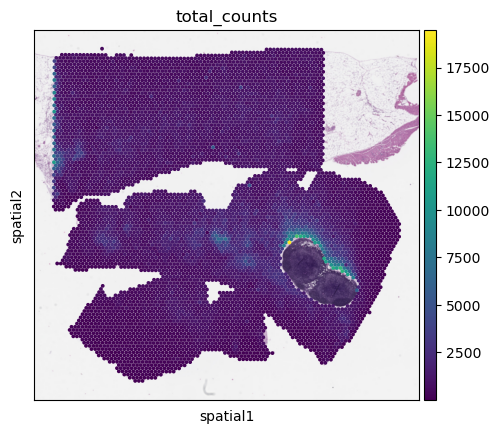

In [10]:
## clean up slide[0] -- B006_3
x = np.array(slides[0].obs['array_col'])
y = np.array(slides[0].obs['array_row'])

box1 = (x >= 125) & (x <= 127) & (y >= 76) & (y <= 82)
box2 = (x >= 131) & (x <= 141) & (y >= 72) & (y <= 74)
box3 = (x >= 127) & (x <= 145) & (y >= 74) & (y <= 82)
box4 = (x >= 145) & (x <= 147) & (y >= 76) & (y <= 82)
box5 = (x >= 147) & (x <= 151) & (y >= 80) & (y <= 82)
box6 = (x >= 130) & (x <= 140) & (y >= 82) & (y <= 85)
box7 = (x >= 132) & (x <= 140) & (y >= 85) & (y <= 87)
box8 = (x >= 140) & (x <= 157) & (y >= 82) & (y <= 90)
box9 = (x >= 157) & (x <= 165) & (y >= 85) & (y <= 90)
box10 = (x >= 143) & (x <= 164) & (y >= 90) & (y <= 91)

misc1 = (x >= 136) & (x <= 138) & (y == 88)
misc2 = (x >= 158) & (x <= 162) & (y == 84)
misc3 = (x >= 146) & (x <= 162) & (y == 92)
misc4 = (x >= 155) & (x <= 159) & (y == 93)
misc5 = (x == 166) & (y >= 86) & (y <= 87)
misc6 = (x == 129) & (y == 83)
misc7 = (x == 73) & (y == 143)
misc8 = (x == 78) & (y == 148)
misc9 = (x == 79) & (y == 149)
misc10 = (x == 159) & (y == 83)
misc11 = (x == 139) & (y == 89)

box_to_take_out = (x >= 148) & (x <= 220) & (y >= 0) & (y <= 49)
area_to_keep = ~(box1 | box2 | box3 | box4 | box5 | box6 | box7 | box8 | box9 | box10 | misc1 | misc2 | misc3 | misc4 | misc5 | misc6 | misc7 | misc8 | misc9 | misc10 | misc11)
area_to_keep = area_to_keep & ~box_to_take_out
slides[0] = slides[0][area_to_keep]
sc.pl.spatial(slides[0], color = 'total_counts', spot_size = 55, img_key='hires')

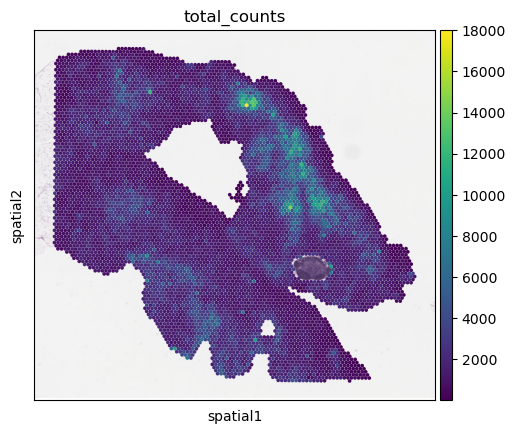

In [11]:
## clean up slide[1] -- A021_3
x = np.array(slides[1].obs['array_col'])
y = np.array(slides[1].obs['array_row'])

box1 = (x >= 135) & (x <= 151)  & (y >= 81) & (y <= 86)
box2 = (x >= 151) & (x <= 153)  & (y >= 82) & (y <= 86)

misc1 = (x >= 140) & (x <= 148)  & (y == 80)
misc2 = (x >= 139) & (x <= 151)  & (y == 87)
misc3 = (x == 134)  & (y == 82)
misc4 = (x == 154)  & (y == 84)

area_to_keep = ~(box1 | box2 | misc1 | misc2 | misc3 | misc4)
slides[1] = slides[1][area_to_keep]
sc.pl.spatial(slides[1], color = 'total_counts', spot_size = 55, img_key='hires')

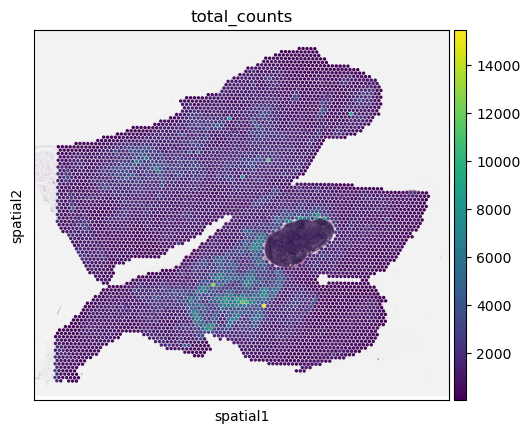

In [12]:
## clean up slide[2] -- A006_3
x = np.array(slides[2].obs['array_col'])
y = np.array(slides[2].obs['array_row'])

box1 = (x >= 106) & (x <= 107)  & (y >= 79) & (y <= 84)
box2 = (x >= 115) & (x <= 125)  & (y >= 74) & (y <= 76)
box3 = (x >= 108) & (x <= 125)  & (y >= 77) & (y <= 85)
box4 = (x >= 125) & (x <= 137)  & (y >= 73) & (y <= 80)
box5 = (x >= 125) & (x <= 133)  & (y >= 80) & (y <= 82)
box6 = (x >= 137) & (x <= 140)  & (y >= 73) & (y <= 78)
misc1 = (x >= 112) & (x <= 114)  & (y == 76)
misc2 = (x >= 112) & (x <= 122)  & (y == 86)
misc3 = (x >= 121) & (x <= 123)  & (y == 73)
misc4 = (x == 134)  & (y == 72)
misc5 = (x == 141)  & (y == 75)
misc6 = (x == 141)  & (y == 77)
misc7 = (x == 127)  & (y == 83)
misc8 = (x == 126)  & (y == 84)

area_to_keep = ~(box1 | box2 | box3 | box4 | box5 | box6 | misc1 | misc2 | misc3 | misc4 | misc5 | misc6 | misc7 | misc8)
slides[2] = slides[2][area_to_keep]
sc.pl.spatial(slides[2], color = 'total_counts', spot_size = 55, img_key='hires')

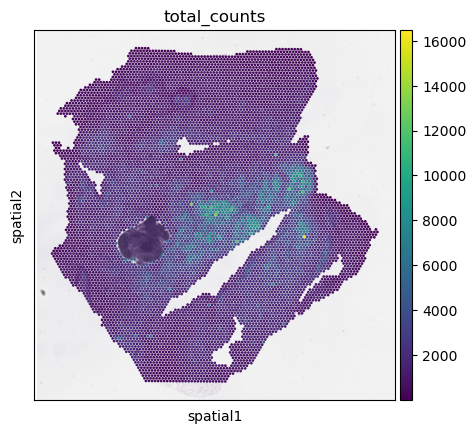

In [13]:
## clean up slide[3] -- A041_6
x = np.array(slides[3].obs['array_col'])
y = np.array(slides[3].obs['array_row'])

box1 = (x >= 48) & (x <= 80)  & (y >= 71) & (y <= 72)
box2 = (x >= 46) & (x <= 75)  & (y >= 73) & (y <= 77)
box3 = (x >= 48) & (x <= 74)  & (y >= 77) & (y <= 79)

misc1 = (x >= 67) & (x <= 69)  & (y == 65)
misc2 = (x >= 64) & (x <= 70)  & (y == 66)
misc3 = (x >= 61) & (x <= 73)  & (y == 67)
misc4 = (x >= 60) & (x <= 74)  & (y == 68)
misc5 = (x >= 57) & (x <= 75)  & (y == 69)
misc6 = (x >= 52) & (x <= 78)  & (y == 70)
misc7 = (x >= 77) & (x <= 79)  & (y ==73)
misc8 = (x >= 50) & (x <= 72)  & (y == 80)
misc9 = (x >= 59) & (x <= 71)  & (y == 81)
misc10 = (x >= 56) & (x <= 66)  & (y == 82)
misc11 = (x >= 59) & (x <= 61)  & (y == 83)
misc12 = (x == 53)  & (y == 81)
misc13 = (x == 76)  & (y == 74)


area_to_keep = ~(box1 | box2 | box3 | misc1 | misc2 | misc3 | misc4 | misc5 | misc6 | misc7 | misc8 | misc9 | misc10 | misc11 | misc12 | misc13)
slides[3] = slides[3][area_to_keep]
sc.pl.spatial(slides[3], color = 'total_counts', spot_size = 55, img_key='hires')

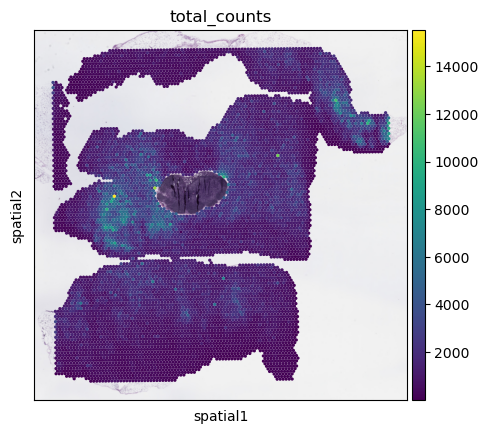

In [14]:
## clean up slide[4] -- B041_6
x = np.array(slides[4].obs['array_col'])
y = np.array(slides[4].obs['array_row'])


misc1 = (x >= 97) & (x <= 105)  & (y == 47)
misc2 = (x >= 78) & (x <= 84)  & (y == 48)
misc3 = (x >= 94) & (x <= 108)  & (y == 48)
misc4 = (x >= 75) & (x <= 111)  & (y == 49)
misc5 = (x >= 73) & (x <= 115)  & (y == 51)
misc6 = (x >= 69) & (x <= 115)  & (y == 53)
misc7 = (x >= 69) & (x <= 113)  & (y ==55)
misc8 = (x >= 69) & (x <= 111)  & (y == 57)
misc9 = (x >= 71) & (x <= 109)  & (y == 59)
misc10 = (x >= 75) & (x <= 99)  & (y == 61)
misc11 = (x >= 83) & (x <= 93)  & (y == 63)

misc12 = (x >= 74) & (x <= 114)  & (y == 50)
misc13 = (x >= 72) & (x <= 114)  & (y == 52)
misc14 = (x >= 68) & (x <= 114)  & (y == 54)
misc15 = (x >= 68) & (x <= 114)  & (y == 56)
misc16 = (x >= 70) & (x <= 110)  & (y == 58)
misc17 = (x >= 72) & (x <= 106)  & (y == 60)
misc18 = (x >= 78) & (x <= 96)  & (y == 62)


area_to_keep = ~(misc1 | misc2 | misc3 | misc4 | misc5 | misc6 | misc7 | misc8 | misc9 | misc10 | misc11 | misc12 | misc13 | misc14 | misc15 | misc16 | misc17 | misc18)
slides[4] = slides[4][area_to_keep]
sc.pl.spatial(slides[4], color = 'total_counts', spot_size = 55, img_key='hires')

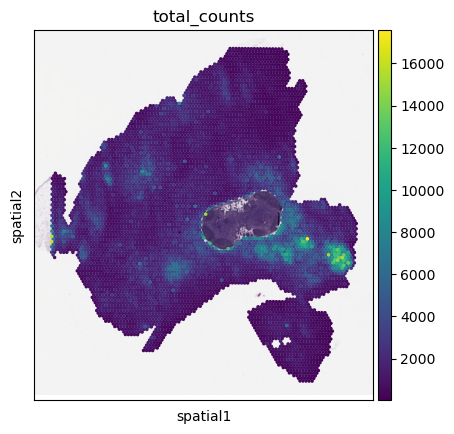

In [15]:
## clean up slide[5] -- B021_6
x = np.array(slides[5].obs['array_col'])
y = np.array(slides[5].obs['array_row'])

box1 = (x >= 102) & (x <= 150)  & (y >= 62) & (y <= 63)
box2 = (x >= 99) & (x <= 147)  & (y >= 64) & (y <= 70)
box3 = (x >= 148) & (x <= 150)  & (y >= 64) & (y <= 67)
box4 = (x >= 101) & (x <= 124)  & (y >= 71) & (y <= 73)
box5 = (x >= 106) & (x <= 120)  & (y >= 74) & (y <= 75)

misc1 = (x >= 138) & (x <= 140)  & (y == 54)
misc2 = (x >= 133) & (x <= 143)  & (y == 55)
misc3 = (x >= 130) & (x <= 146)  & (y == 56)
misc4 = (x >= 123) & (x <= 147)  & (y == 57)
misc5 = (x >= 118) & (x <= 148)  & (y == 58)
misc6 = (x >= 113) & (x <= 149)  & (y == 59)
misc7 = (x >= 108) & (x <= 150)  & (y == 60)
misc8 = (x >= 105) & (x <= 151)  & (y == 61)
misc9 = (x >= 125) & (x <= 141)  & (y == 71)
misc10 = (x >= 110) & (x <= 114)  & (y == 76)
misc11 = (x == 148)  & (y == 68)


area_to_keep = ~(box1 | box2 | box3 | box4 | box5 | misc1 | misc2 | misc3 | misc4 | misc5 | misc6 | misc7 | misc8 | misc9 | misc10 | misc11)
slides[5] = slides[5][area_to_keep]
sc.pl.spatial(slides[5], color = 'total_counts', spot_size = 55, img_key='hires')

## Return to analysis

In [16]:
# Combine anndata objects together
adata_vis = slides[0].concatenate(
    slides[1:],
    batch_key="sample",
    uns_merge="unique",
    batch_categories=sample_data['sample_name'],
    index_unique=None
)

In [17]:
adata_vis.var

,feature_types,genome,SYMBOL,mt,n_cells_by_counts-A006_3,mean_counts-A006_3,log1p_mean_counts-A006_3,pct_dropout_by_counts-A006_3,total_counts-A006_3,log1p_total_counts-A006_3,...,log1p_mean_counts-B021_6,pct_dropout_by_counts-B021_6,total_counts-B021_6,log1p_total_counts-B021_6,n_cells_by_counts-B041_6,mean_counts-B041_6,log1p_mean_counts-B041_6,pct_dropout_by_counts-B041_6,total_counts-B041_6,log1p_total_counts-B041_6
ENSEMBL,,,,,,,,,,,,,,,,,,,,,
ENSMUSG00000051951,Gene Expression,mm10,Xkr4,False,76,0.012913,0.012830,98.725474,77.0,4.356709,...,0.023233,97.758152,173.0,5.159055,75,0.008255,0.008222,99.185314,76.0,4.343805
ENSMUSG00000025900,Gene Expression,mm10,Rp1,False,127,0.021466,0.021239,97.870200,128.0,4.859812,...,0.041126,96.154891,309.0,5.736572,150,0.017380,0.017231,98.370628,160.0,5.081404
ENSMUSG00000025902,Gene Expression,mm10,Sox17,False,646,0.124266,0.117131,89.166527,741.0,6.609349,...,0.105021,90.013587,815.0,6.704414,992,0.125027,0.117807,89.224419,1151.0,7.049255
ENSMUSG00000025903,Gene Expression,mm10,Lypla1,False,665,0.128459,0.120853,88.847895,766.0,6.642487,...,0.180395,84.701087,1455.0,7.283448,909,0.119487,0.112871,90.126005,1100.0,7.003974
ENSMUSG00000033813,Gene Expression,mm10,Tcea1,False,914,0.190340,0.174239,84.672145,1135.0,7.035269,...,0.224664,82.228261,1854.0,7.525640,1107,0.164349,0.152162,87.975234,1513.0,7.322510
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSMUSG00000000103,Gene Expression,mm10,Zfy2,False,22,0.003857,0.003850,99.631058,23.0,3.178054,...,0.007175,99.293478,53.0,3.988984,28,0.003041,0.003037,99.695851,28.0,3.367296
ENSMUSG00000069036,Gene Expression,mm10,Sry,False,34,0.005702,0.005686,99.429817,34.0,3.555348,...,0.008658,99.130435,64.0,4.174387,35,0.003802,0.003795,99.619813,35.0,3.583519
ENSMUSG00000102053,Gene Expression,mm10,Gm4064,False,53,0.009056,0.009015,99.111186,54.0,4.007333,...,0.011886,98.845109,88.0,4.488636,33,0.003585,0.003578,99.641538,33.0,3.526361


In [18]:
adata_vis.obs

,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,mt_frac
spot_id,,,,,,,,,,,,,
B006_3_AACAATCCGAGTGGAC-1,1,103,47,B006_3,253,5.537334,281.0,5.641907,27.758007,45.551601,81.138790,100.000000,0.0
B006_3_AACAATGGAACCACAT-1,1,54,32,B006_3,822,6.712956,1059.0,6.966024,23.040604,31.822474,41.265345,69.593957,0.0
B006_3_AACAATGTGCTCCGAG-1,1,98,158,B006_3,1283,7.157735,1897.0,7.548556,21.349499,29.362151,40.274117,58.724302,0.0
B006_3_AACACCAGCCTACTCG-1,1,31,39,B006_3,872,6.771936,1134.0,7.034388,21.516755,30.335097,40.740741,67.195767,0.0
B006_3_AACACCGAGCTTGGAT-1,1,56,24,B006_3,565,6.338594,655.0,6.486161,21.374046,29.007634,44.274809,90.076336,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
B021_6_TGTTGGTGAGCGGACG-1,1,59,17,B021_6,986,6.894670,1143.0,7.042286,15.223097,22.484689,31.233596,57.480315,0.0
B021_6_TGTTGGTGCGCACGAG-1,1,24,108,B021_6,646,6.472346,817.0,6.706862,23.745410,33.170135,45.410037,82.129743,0.0
B021_6_TGTTGGTGCGCTTCGC-1,1,37,127,B021_6,859,6.756932,1184.0,7.077498,25.168919,33.614865,44.341216,69.679054,0.0


In [19]:
adata_vis.var.set_index('SYMBOL', drop=False, inplace=True)
adata_vis.var.index.name = None

In [20]:
## average or get rid of non-unique gene symbols now that you've gotten rid of ENSEMBL IDs
print('total genes:' + str(len(adata_vis.var.index)))
print('unique genes:' + str(len(np.unique(adata_vis.var.index))))
print('duplicates to make unique:' + str(len(adata_vis.var.index)-len(np.unique(adata_vis.var.index))))


total genes:19465
unique genes:19454
duplicates to make unique:11


In [21]:
adata_vis.var.index = adata_vis.var.index.tolist()
adata_vis.var_names_make_unique()

In [22]:
# find mitochondria-encoded (MT) genes
adata_vis.var['MT_gene'] = [gene.startswith('MT-') for gene in adata_vis.var['SYMBOL']]

# remove MT genes for spatial mapping (keeping their counts in the object)
adata_vis.obsm['MT'] = adata_vis[:, adata_vis.var['MT_gene'].values].X.toarray()
adata_vis = adata_vis[:, ~adata_vis.var['MT_gene'].values]

In [23]:
# find shared genes and subset both anndata and reference signatures
intersect = np.intersect1d(adata_vis.var_names, inf_aver.index)
adata_vis = adata_vis[:, intersect].copy()

inf_aver_copy = inf_aver.copy() ## infer_aver has non-unique rownames -- fix
inf_aver_copy['genes'] = inf_aver_copy.index
inf_aver_copy = inf_aver_copy.groupby('genes').mean().reset_index() ## average expression of genes with non-unique symbols
inf_aver_copy.index = inf_aver_copy['genes'] 
inf_aver_copy.index.name = None
inf_aver_copy = inf_aver_copy.drop(columns=['genes'])
inf_aver = inf_aver_copy.loc[intersect, :].copy()  
inf_aver

# prepare anndata for cell2location model
cell2location.models.Cell2location.setup_anndata(adata=adata_vis, batch_key="sample")


## Cell2location spatial mapping

In [24]:
# create and train the model
mod = cell2location.models.Cell2location(
    adata_vis, cell_state_df=inf_aver,
    # the expected average cell abundance: tissue-dependent
    # hyper-prior which can be estimated from paired histology:
    N_cells_per_location=2,
    # hyperparameter controlling normalisation of
    # within-experiment variation in RNA detection:
    detection_alpha=20
)
mod.view_anndata_setup()

Anndata setup with scvi-tools version 0.20.0.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'sample',
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   6   │
│         n_cells          │ 44200 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   1   │
│          n_vars          │ 11948 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                   batch State Registry                   
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │   B006_3   │          0          │
│                     │   A021_3   │          1          │
│                     │   A006_3   │          2          │
│                     │   A041_6   │          3          │
│                     │   B041_6   │          4          │
│                     │   B021_6   │          5          │
└─────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 3000/3000: 100%|██████████| 3000/3000 [16:48:18<00:00, 21.59s/it, v_num=1, elbo_train=1.33e+8]

`Trainer.fit` stopped: `max_epochs=3000` reached.


Epoch 3000/3000: 100%|██████████| 3000/3000 [16:48:18<00:00, 20.17s/it, v_num=1, elbo_train=1.33e+8]


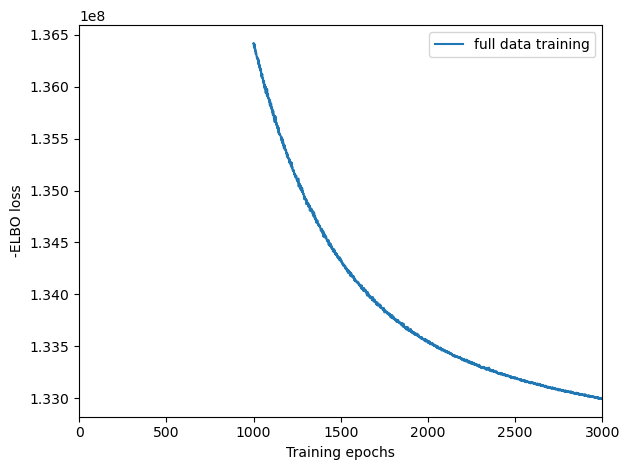

In [26]:
mod.train(max_epochs=3000,
          # train using full data (batch_size=None)
          batch_size=None,
          # use all data points in training because
          # we need to estimate cell abundance at all locations
          train_size=1,
          use_gpu=False,
         )

# plot ELBO loss history during training, removing first 100 epochs from the plot
mod.plot_history(1000)
plt.legend(labels=['full data training']);

In [27]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_vis = mod.export_posterior(
    adata_vis, sample_kwargs={'num_samples': 1000, 'batch_size': mod.adata.n_obs, 'use_gpu': False}
)

# Save model
mod.save(f"{run_name}", overwrite=True)

# mod = cell2location.models.Cell2location.load(f"{run_name}", adata_vis)

# Save anndata object with results
adata_file = f"{run_name}/sp.h5ad"
adata_vis.write(adata_file)
adata_file

Sampling global variables, sample: 100%|██████████| 999/999 [32:21<00:00,  1.94s/it]


'/khayyam/ssobti/projects/farnaz_spatial/output_data/mouse_late_2023/cell2location/multi_ref_annot/cell2location_map/N2_alpha20_cleaned_slides_v2/sp.h5ad'

In [25]:
## reload cell decovoluted model later
adata_file = f"{run_name}/sp.h5ad"
adata_vis = sc.read_h5ad(adata_file)
mod = cell2location.models.Cell2location.load(f"{run_name}", adata_vis)
adata_vis_new = mod.export_posterior(adata_vis, sample_kwargs={'num_samples': 1000, 'batch_size': mod.adata.n_obs, 'use_gpu':False})

INFO     File                                                                                                      
         /home/ssobti/projects/farnaz_spatial/output_data/mouse_late_2023/cell2location/multi_ref_annot/cell2locati
         on_map/N2_alpha20_cleaned_slides_v2/model.pt already downloaded                                           


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 1/30000:   0%|          | 1/30000 [00:18<155:58:40, 18.72s/it, v_num=1, elbo_train=1.91e+8]

`Trainer.fit` stopped: `max_steps=1` reached.


Sampling global variables, sample: 100%|██████████| 999/999 [28:57<00:00,  1.74s/it]


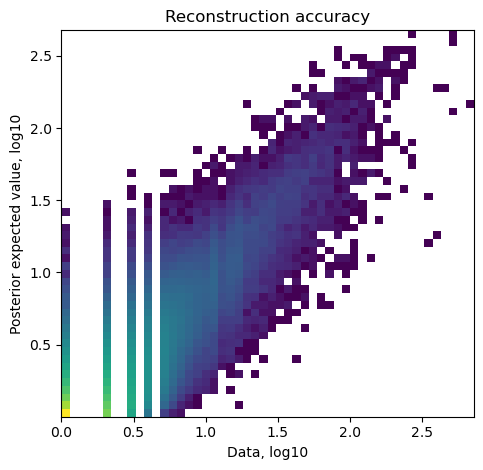

In [26]:
mod.plot_QC()

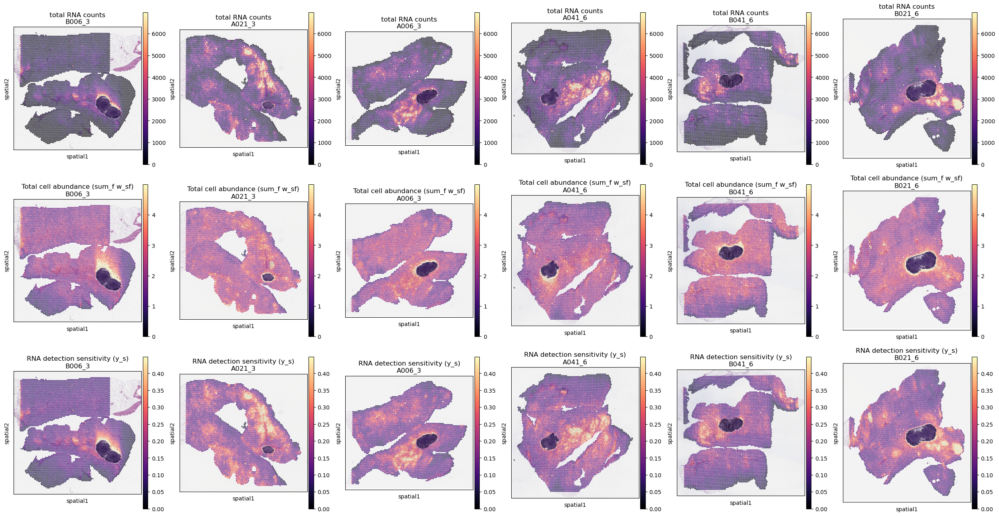

In [31]:
fig = mod.plot_spatial_QC_across_batches()

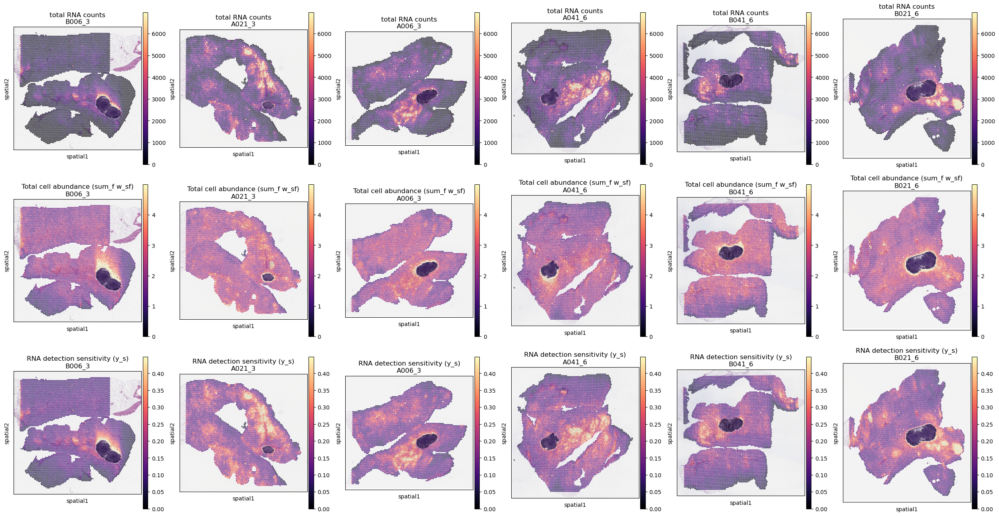

In [32]:
fig